In [38]:
import os
import sys
import glob
import pickle
import pandas as pd
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.linear_model import LogisticRegression
from autogluon.tabular import TabularDataset, TabularPredictor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score,balanced_accuracy_score,roc_auc_score,confusion_matrix,roc_curve
from perpetual import PerpetualBooster
from tabpfn import TabPFNClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.model_selection import StratifiedKFold
from collections import Counter

In [39]:
sys.path.append("../../Utils")
from loaders import HNSCCFeatureHandler

METADATA_PATH = "../../Supplementary_Tables/ST1/RAW_HNSCC_METADATA_NEW.csv"
VALID_IDS_PATH = "../../Utils/Lists/cv_ids.txt"
HOLD_IDS_PATH = '../../Utils/Lists/holdout_ids.txt'

def load_feature(path,idx,val,zscore=True,batch=True):
    f=HNSCCFeatureHandler(METADATA_PATH,VALID_IDS_PATH,HOLD_IDS_PATH)
    f.load_feature_to_dataframe(path,idx,val)
    f.normalize_zscore()
    f.merge_feature_metadata()
    if batch: f.batch_correct()
    return f
    
metrics = []
delfi=load_feature("/projects/b1198/epifluidlab/ravi/0401/headneck/data/hg38_frag_filtered/*.hg38.frag.delfi.bed",1,12)
mds=load_feature("/projects/b1198/epifluidlab/ravi/0401/headneck/data/hg38_frag_filtered/*.hg38.frag.interval_mds.tsv",0,4)
train_ids=list(delfi.institute1_ids)+list(delfi.institute2_ids)+list(delfi.institute3_ids)+list(delfi.institute4_ids)
test_ids=list(delfi.institute5_ids)+list(delfi.institute6_ids)


def prepare_train_test(data):
    def build_df(ids):
        feats=data.get_raw_features(data.get_subset(ids))
        meta=data.get_metadata_col("Treatment Response",data.get_subset(ids))
        pno=data.get_metadata_col("Patient Number",data.get_subset(ids))
        tov=data.get_metadata_col("Type of Visit",data.get_subset(ids))
        return pd.concat([feats, meta, pno, tov],axis=1)
    return build_df(train_ids),build_df(test_ids),pd.concat([data.get_raw_features(data.hold_data),data.get_metadata_col("Patient Number",data.hold_data), data.get_metadata_col("Type of Visit",data.hold_data),data.get_metadata_col("Treatment Response",data.hold_data)],axis=1)

delfi_train,delfi_test,delfi_hold=prepare_train_test(delfi)
mds_train,mds_test,mds_hold=prepare_train_test(mds)

In [40]:
def compute_fold_metrics(y_true, y_prob, y_pred, fold=None):
    m = {
        "accuracy":      accuracy_score(y_true, y_pred),
        "f1":            f1_score(y_true, y_pred),
        "precision":     precision_score(y_true, y_pred),
        "recall":        recall_score(y_true, y_pred),
        "balanced_ac":   balanced_accuracy_score(y_true, y_pred),
        "roc_auc":       roc_auc_score(y_true, y_prob)
    }
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    m.update({
        "tn": tn,
        "fp": fp,
        "fn": fn,
        "tp": tp
    })

    fpr, tpr, thresholds = roc_curve(y_true, y_prob)
    m["roc_curve"] = {
        "fpr": fpr.tolist(),
        "tpr": tpr.tolist(),
        "thresholds": thresholds.tolist()
    }
    if fold is not None:
        m["fold"] = fold
    return m

def print_classification_metrics(df):
    y_true = df["Treatment Response"] == "Responder"
    y_pred = df["Predicted Treatment Response"] == "Responder"
    y_score = df["Final Weighted Prediction"]

    metrics = {
        "accuracy": accuracy_score(y_true, y_pred),
        "f1": f1_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred),
        "recall": recall_score(y_true, y_pred),
        "balanced_ac": balanced_accuracy_score(y_true, y_pred),
        "roc_auc": roc_auc_score(y_true, y_score)
    }
    for k, v in metrics.items():
        print(f"{k}\t{v:.3f}")

def plot_metrics(metrics, title=''):
    fpr = metrics['roc_curve']['fpr']
    tpr = metrics['roc_curve']['tpr']
    roc_auc = metrics['roc_auc']
    cm = np.array([[metrics['tn'], metrics['fp']],
                   [metrics['fn'], metrics['tp']]])
    
    plt.figure(figsize=(8, 4), dpi=1000)
    
    plt.subplot(1, 2, 1)
    plt.plot(fpr, tpr, color='mediumpurple')
    plt.text(0.55, 0.05, f'ROC AUC: {roc_auc:.2f}', fontsize=12, color='red')
    plt.plot([0, 1], [0, 1], color='black', alpha=0.3, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.xlim(-0.03, 1)
    plt.ylim(0, 1.03)
    
    plt.subplot(1,2, 2)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', cbar=False,
                xticklabels=['Responder', 'Non-Responder'],
                yticklabels=['Responder', 'Non-Responder'])
    
    plt.tight_layout()
    plt.savefig(f'{title}.pdf')

def adjust_coefficients_mean(group):
    prob = group['mds'].mean()
    resp = group['Treatment Response'].iloc[0]
    return pd.Series({
        'Final Weighted Prediction': prob,
        'Treatment Response': resp,
        'Predicted Treatment Response': 'Responder' if prob >= 0.5 else 'Non-Responder'
    })

def adjust_coefficients_priority(group):
    visit_priority = {'Screen': 0, 'Day 0': 1, 'Adj Wk 1': 2}
    group = group.copy()
    group['Visit Priority'] = group['Type of Visit'].map(visit_priority)
    most_recent = group.loc[group['Visit Priority'].idxmax()]

    prob = most_recent['mds']
    resp = most_recent['Treatment Response']
    return pd.Series({
        'Final Weighted Prediction': prob,
        'Treatment Response': resp,
        'Predicted Treatment Response': 'Responder' if prob >= 0.5 else 'Non-Responder'
    })

def plot_roc(df, title, fname):
    fpr, tpr, _ = roc_curve(df['Treatment Response'] == 'Responder', df['Final Weighted Prediction'])
    auc_score = roc_auc_score(df['Treatment Response'] == 'Responder', df['Final Weighted Prediction'])
    plt.figure(figsize=(2, 2), dpi=300)
    plt.plot(fpr, tpr, color="mediumpurple")
    plt.plot([0, 1], [0, 1], linestyle='--', color='black', alpha=0.3)
    plt.text(0.4, 0.05, f"ROC AUC: {auc_score:.2f}", fontsize=6)
    plt.title(title, fontsize=6)
    plt.xlabel("False Positive Rate", fontsize=6)
    plt.ylabel("True Positive Rate", fontsize=6)
    plt.xticks(fontsize=6)
    plt.yticks(fontsize=6)
    plt.gca().set_aspect('equal')
    plt.tight_layout()
    plt.savefig(fname)
    plt.show()

def plot_cm(df, title, fname):
    cm = confusion_matrix(df['Treatment Response'], df['Predicted Treatment Response'], labels=['Responder', 'Non-Responder'])
    plt.figure(figsize=(2.5, 2.5), dpi=300)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples', cbar=False,
                xticklabels=['Responder', 'Non-Responder'], yticklabels=['Responder', 'Non-Responder'],
                annot_kws={"fontsize": 6})
    plt.title(title, fontsize=6)
    plt.xlabel('Predicted Label', fontsize=6)
    plt.ylabel('True Label', fontsize=6)
    plt.xticks(fontsize=6)
    plt.yticks(fontsize=6)
    plt.tight_layout()
    plt.savefig(fname)
    plt.show()

In [41]:
def train_model(
    df1, df2,
    response_col="Treatment Response",
    k_features1=500, k_features2=500,
    base_model_cls1=None, base_model_kwargs1=None,
    base_model_cls2=None, base_model_kwargs2=None,
    cv=10, random_state=42,
):
    X1 = df1.drop(columns=[response_col, "Patient Number", "Type of Visit"])
    X2 = df2.drop(columns=[response_col, "Patient Number", "Type of Visit"])
    y  = (df1[response_col] == "Responder").astype(int).to_numpy()

    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=random_state)
    oof1 = np.zeros(len(df1))
    oof2 = np.zeros(len(df1))

    for i, (tr, val) in enumerate(skf.split(X1, y)):
        svd1 = TruncatedSVD(n_components=k_features1, random_state=random_state)
        svd2 = TruncatedSVD(n_components=k_features2, random_state=random_state)
        X1_tr, X1_val = svd1.fit_transform(X1.iloc[tr]), svd1.transform(X1.iloc[val])
        X2_tr, X2_val = svd2.fit_transform(X2.iloc[tr]), svd2.transform(X2.iloc[val])

        m1 = base_model_cls1(**(base_model_kwargs1 or {})).fit(X1_tr, y[tr])
        m2 = base_model_cls2(**(base_model_kwargs2 or {})).fit(X2_tr, y[tr])

        oof1[val] = m1.predict_proba(X1_val)[:, 1]
        oof2[val] = m2.predict_proba(X2_val)[:, 1]

        m1_prob = oof1[val]
        m1_pred = (m1_prob >= 0.5).astype(int)
        metrics.append(compute_fold_metrics(y[val], m1_prob, m1_pred, fold=f"DELFI_{i}"))

        m2_prob = oof2[val]
        m2_pred = (m2_prob >= 0.5).astype(int)
        metrics.append(compute_fold_metrics(y[val], m2_prob, m2_pred, fold=f"MDS_{i}"))

    svd1 = TruncatedSVD(n_components=k_features1, random_state=random_state).fit(X1)
    svd2 = TruncatedSVD(n_components=k_features2, random_state=random_state).fit(X2)
    m1   = base_model_cls1(**(base_model_kwargs1 or {})).fit(svd1.transform(X1), y)
    m2   = base_model_cls2(**(base_model_kwargs2 or {})).fit(svd2.transform(X2), y)

    return svd1, svd2, m1, m2

def eval_model(
    df_test1, df_test2,
    svd1, svd2,
    m1, m2,
    name,
    response_col="Treatment Response"
):

    X1 = df_test1.drop(columns=[response_col, "Patient Number", "Type of Visit"])
    X2 = df_test2.drop(columns=[response_col, "Patient Number", "Type of Visit"])
    X1_red = svd1.transform(X1)
    X2_red = svd2.transform(X2)

    visits = ["Screen", "Day 0", "Adj Wk 1", "Overall"]
    probs = {"delfi": {}, "mds": {}, "ensemble": {}}

    for prefix, model, X_red in [("DELFI", m1, X1_red), ("MDS", m2, X2_red)]:
        df_test = df_test1 if prefix == "DELFI" else df_test2
        for visit in visits:
            mask = slice(None) if visit == "Overall" else (df_test["Type of Visit"] == visit)
            fold = "Overall" if visit == "Overall" else visit.replace(" ", "_")
            Xv = X_red[df_test.index.get_indexer(df_test.index[mask])]
            yv = (df_test.loc[mask, response_col] == "Responder").astype(int)
            p  = model.predict_proba(Xv)[:, 1]
            yp = (p >= 0.5).astype(int)
            metrics.append(compute_fold_metrics(yv, p, yp, fold=f"{prefix}_{name}_{fold}"))
            probs[prefix.lower()][visit] = pd.Series(p, index=df_test.index[mask])


    p1     = pd.DataFrame(probs["delfi"]["Overall"], columns=["delfi"])
    p2     = pd.DataFrame(probs["mds"]["Overall"],   columns=["mds"])
    return p1, p2

delfi_svd, mds_svd, delfi_m, mds_m = train_model(
    delfi_train,mds_train,
    k_features1=10,
    k_features2=10,
    base_model_cls1=TabPFNClassifier,
    base_model_cls2=TabPFNClassifier,
    random_state=42
)

In [42]:
delfi_test_eval, mds_test_eval = eval_model(delfi_test, mds_test, delfi_svd, mds_svd, delfi_m, mds_m, "Institute_Hold_Out")
delfi_hold_eval, mds_hold_eval = eval_model(delfi_hold, mds_hold, delfi_svd, mds_svd, delfi_m, mds_m, "Pre_Hold_Out")

In [43]:
df_institute = pd.concat([delfi_test_eval, mds_test_eval, delfi_test['Treatment Response'], delfi_test['Patient Number'], delfi_test['Type of Visit']], axis=1)

In [44]:
institute_predictions = df_institute.groupby('Patient Number').apply(adjust_coefficients_mean)

In [45]:
institute_predictions

,Final Weighted Prediction,Treatment Response,Predicted Treatment Response
Patient Number,,,
18,0.996861,Responder,Responder
20,0.560661,Non-Responder,Responder
21,0.931916,Responder,Responder
22,0.401827,Non-Responder,Non-Responder
23,0.000849,Non-Responder,Non-Responder
24,0.045772,Non-Responder,Non-Responder
25,0.144793,Responder,Non-Responder
26,0.430928,Non-Responder,Non-Responder
27,0.002589,Non-Responder,Non-Responder


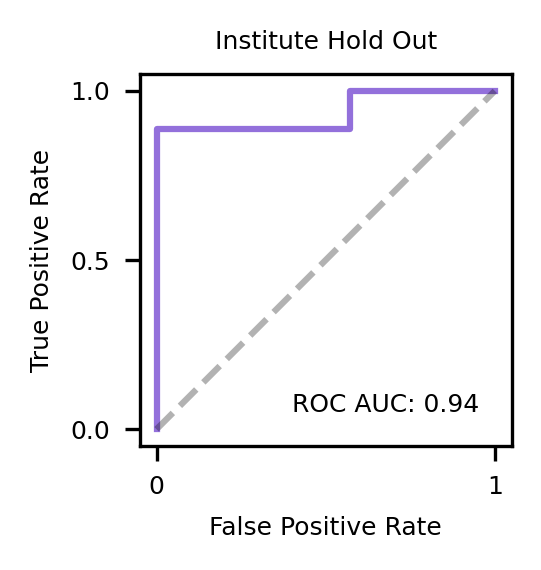

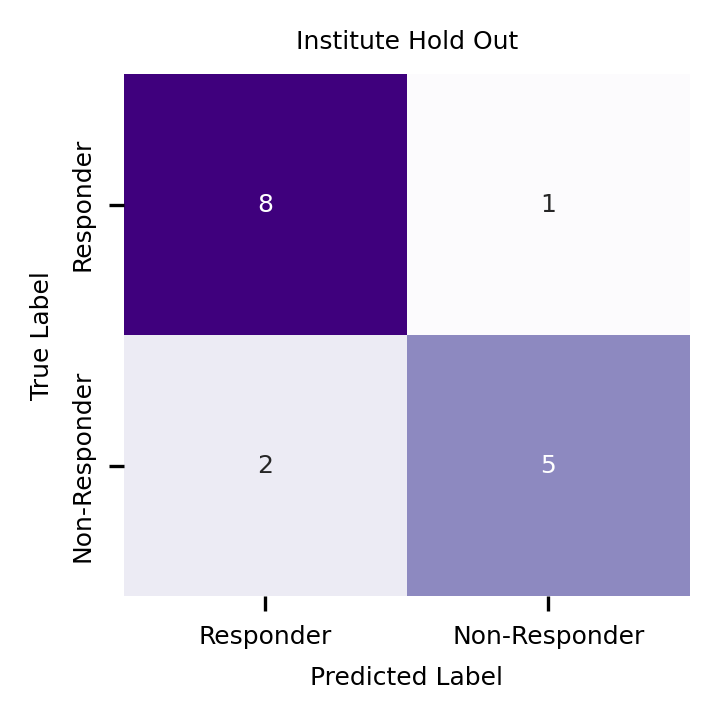

In [46]:
plot_roc(institute_predictions, "Institute Hold Out", "Institute_ROC.pdf")
plot_cm(institute_predictions, "Institute Hold Out", "Institute_CM.pdf")

In [47]:
print_classification_metrics(institute_predictions)

accuracy	0.812
f1	0.842
precision	0.800
recall	0.889
balanced_ac	0.802
roc_auc	0.937


In [48]:
df_hold = pd.concat([delfi_hold_eval, mds_hold_eval, delfi_hold['Treatment Response'], delfi_hold['Patient Number'], delfi_hold['Type of Visit']], axis=1)

In [49]:
hold_predictions = df_hold.groupby('Patient Number').apply(adjust_coefficients_mean)

In [50]:
hold_predictions

,Final Weighted Prediction,Treatment Response,Predicted Treatment Response
Patient Number,,,
12,0.250128,Non-Responder,Non-Responder
15,0.064796,Non-Responder,Non-Responder
16,0.344003,Non-Responder,Non-Responder
19,0.422280,Non-Responder,Non-Responder
37,0.999165,Responder,Responder
39,0.999365,Responder,Responder
43,0.989052,Responder,Responder
45,0.339085,Responder,Non-Responder
52,0.016299,Non-Responder,Non-Responder


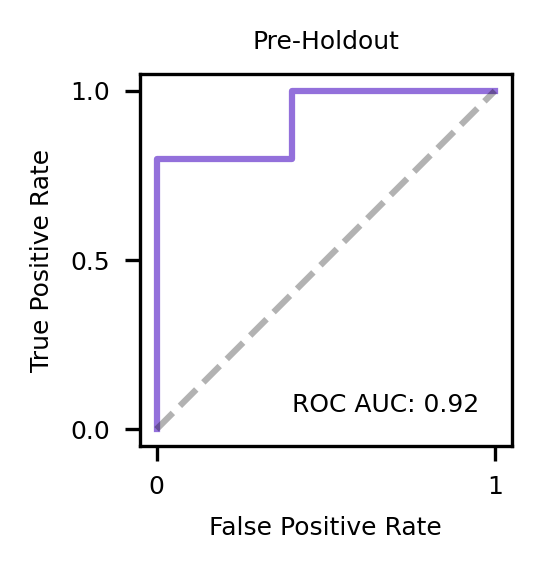

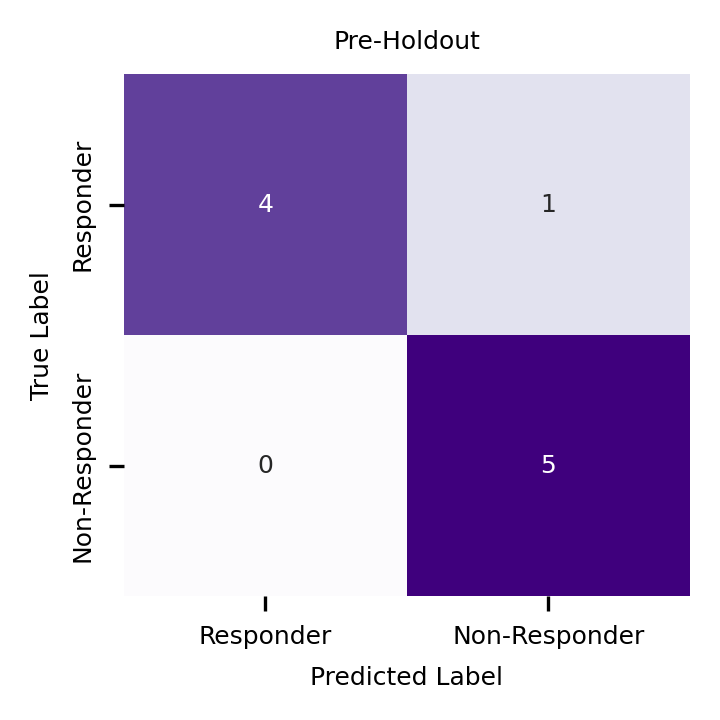

In [51]:
plot_roc(hold_predictions, "Pre-Holdout", "PreHold_ROC.pdf")
plot_cm(hold_predictions, "Pre-Holdout", "PreHold_CM.pdf")

In [52]:
print_classification_metrics(hold_predictions)

accuracy	0.900
f1	0.889
precision	1.000
recall	0.800
balanced_ac	0.900
roc_auc	0.920


In [16]:
pd.DataFrame(metrics).to_csv('ST5.csv')

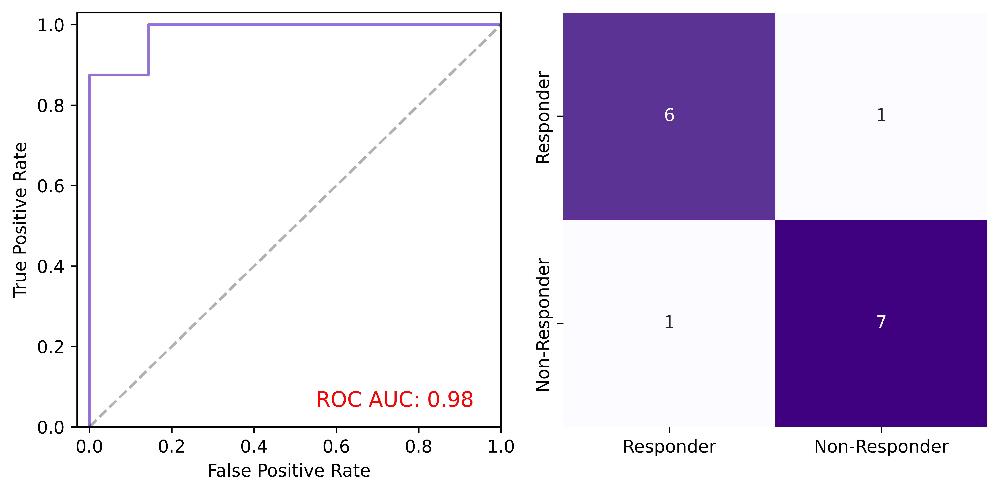

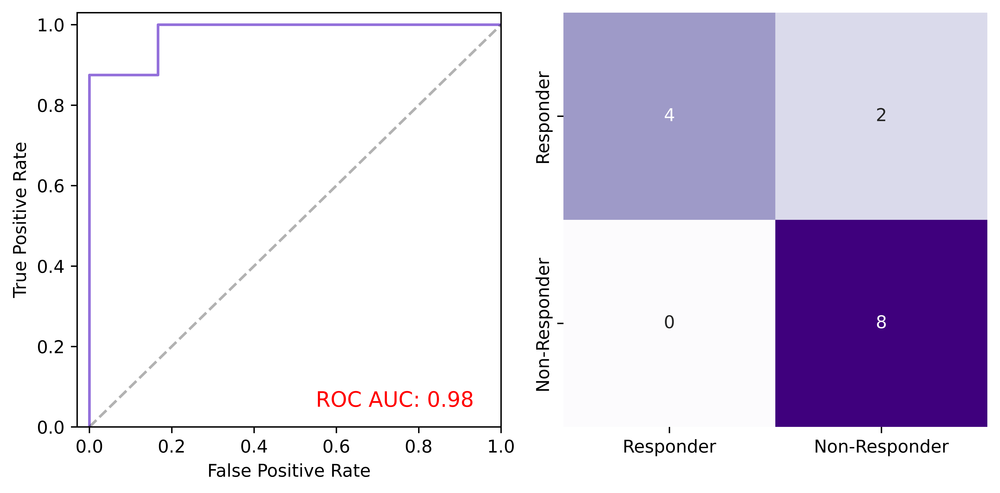

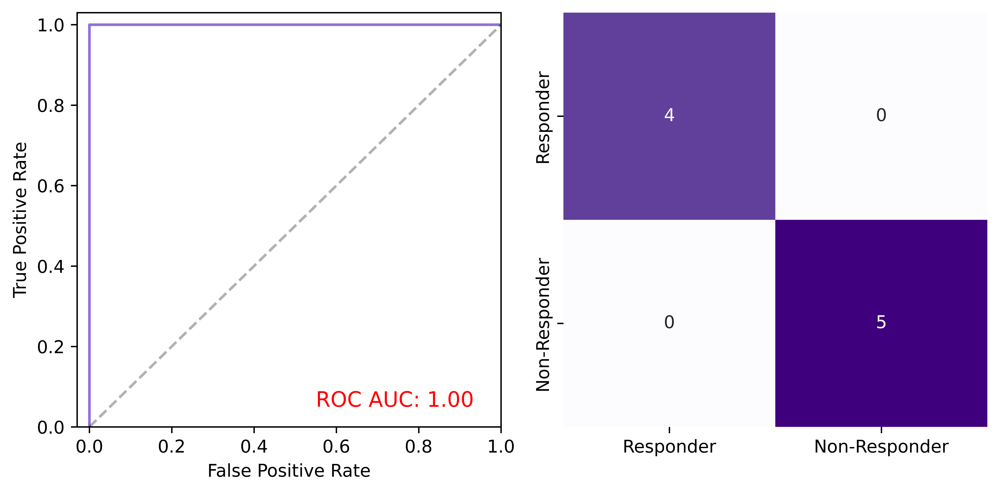

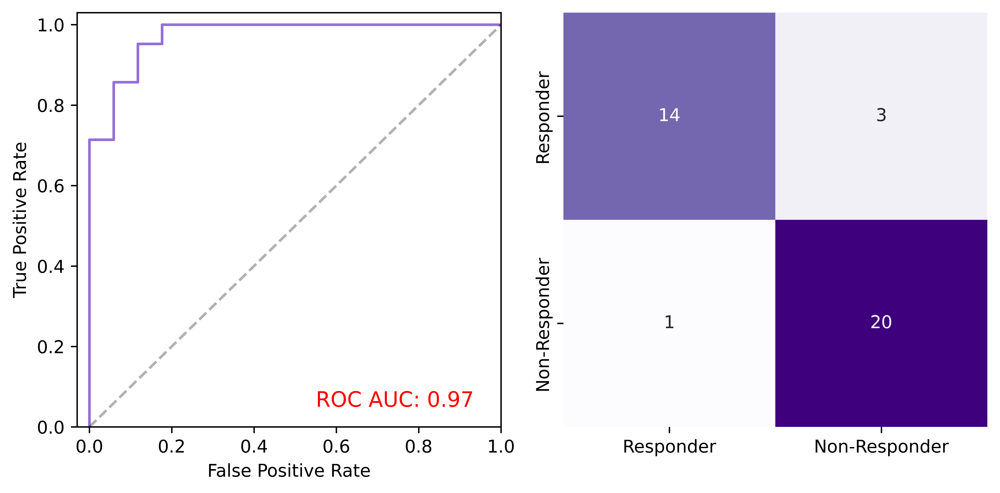

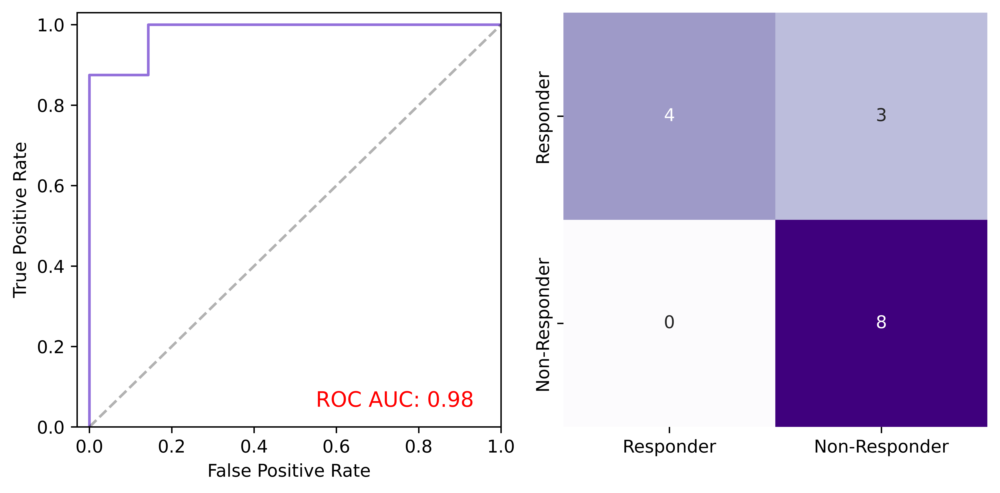

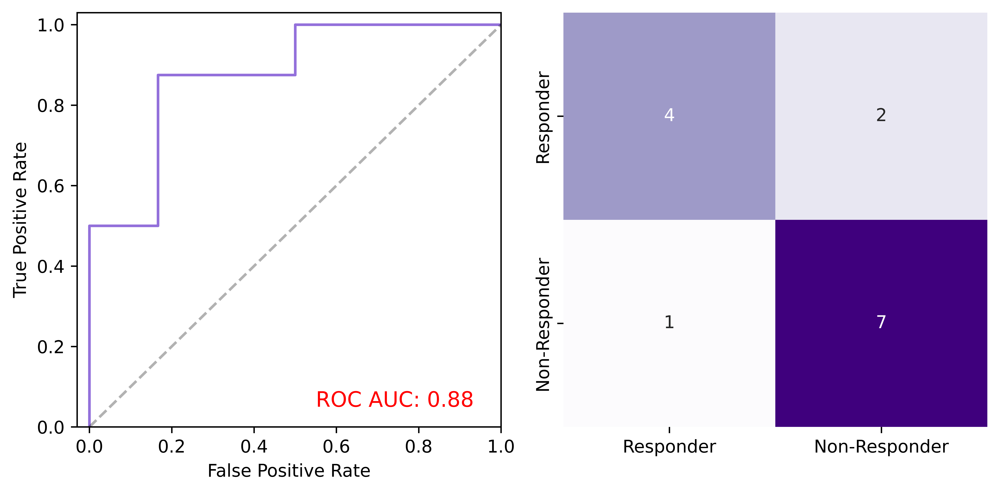

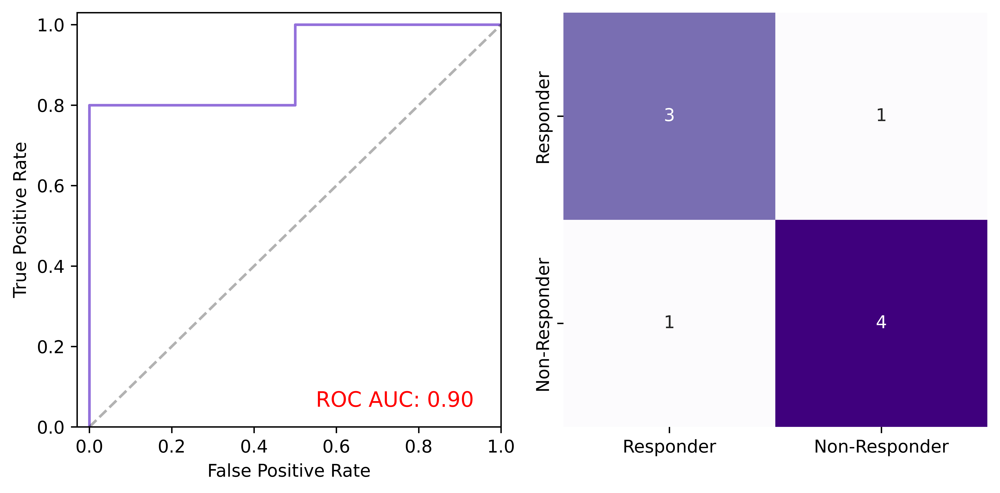

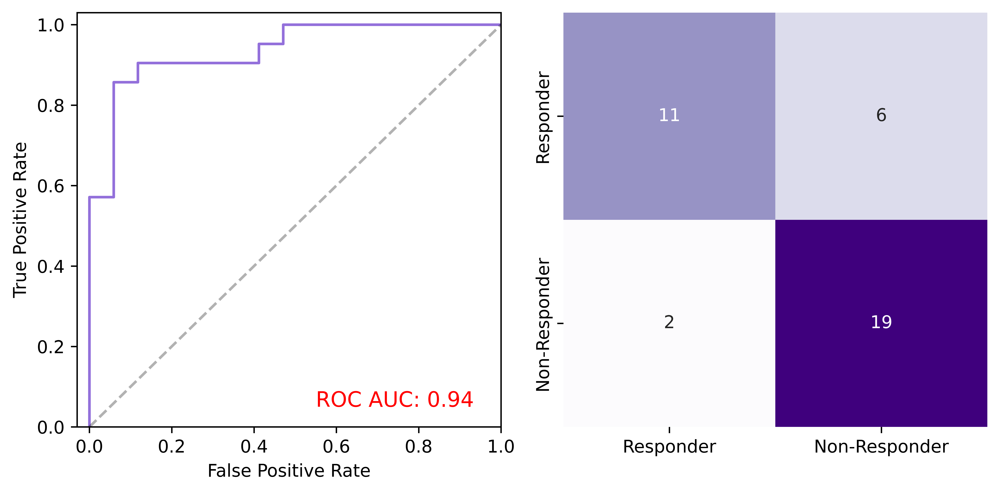

In [17]:
plot_metrics(metrics[20], title='DELFI_Institute_Screen')
plot_metrics(metrics[21], title='DELFI_Institute_Day0')
plot_metrics(metrics[22], title='DELFI_Institute_AdjWk1')
plot_metrics(metrics[23], title='DELFI_Institute_Overall')

plot_metrics(metrics[24], title='MDS_Institute_Screen')
plot_metrics(metrics[25], title='MDS_Institute_Day0')
plot_metrics(metrics[26], title='MDS_Institute_AdjWk1')
plot_metrics(metrics[27], title='MDS_Institute_Overall')

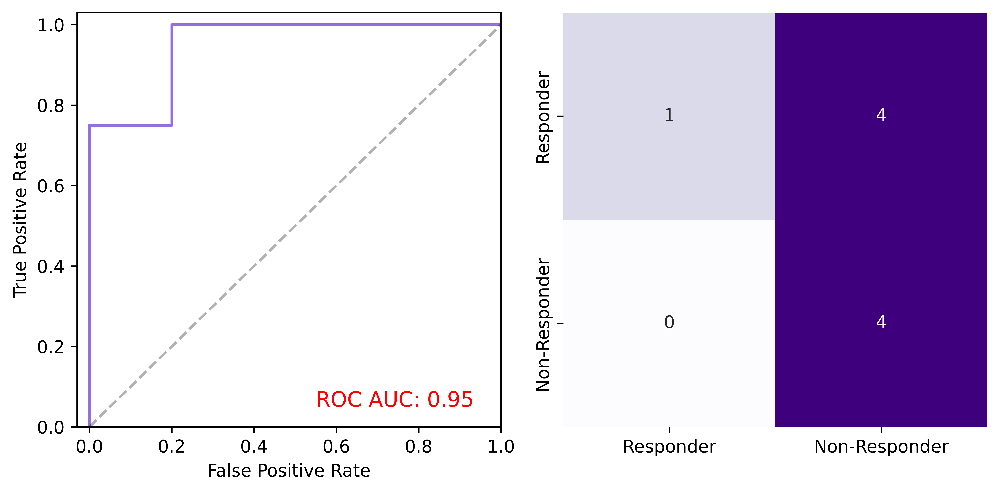

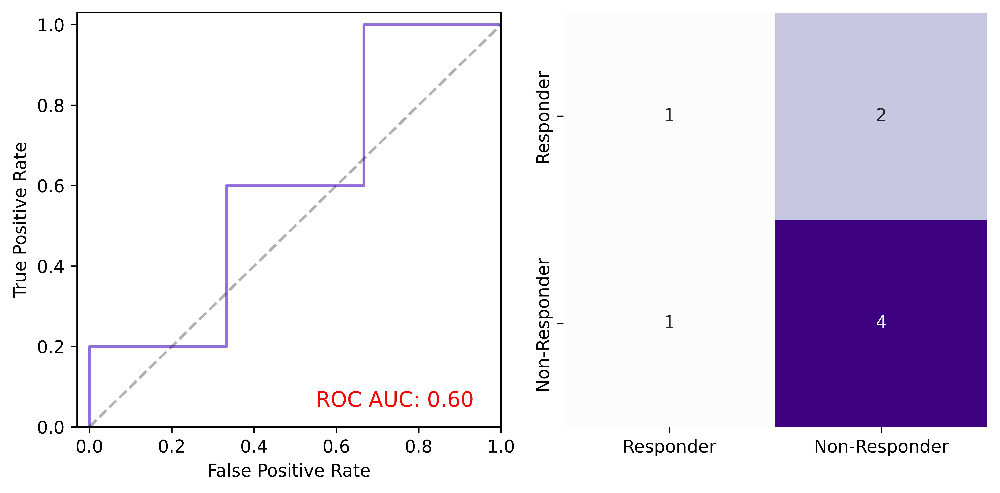

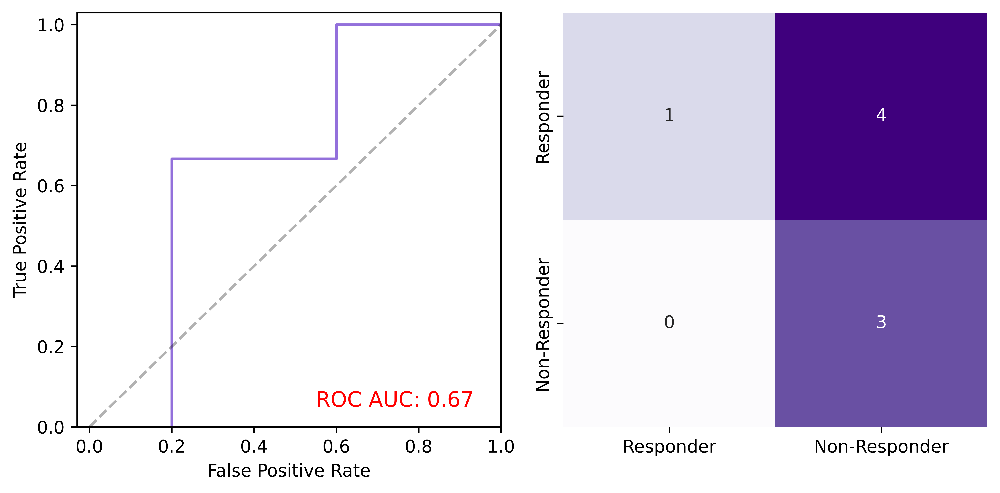

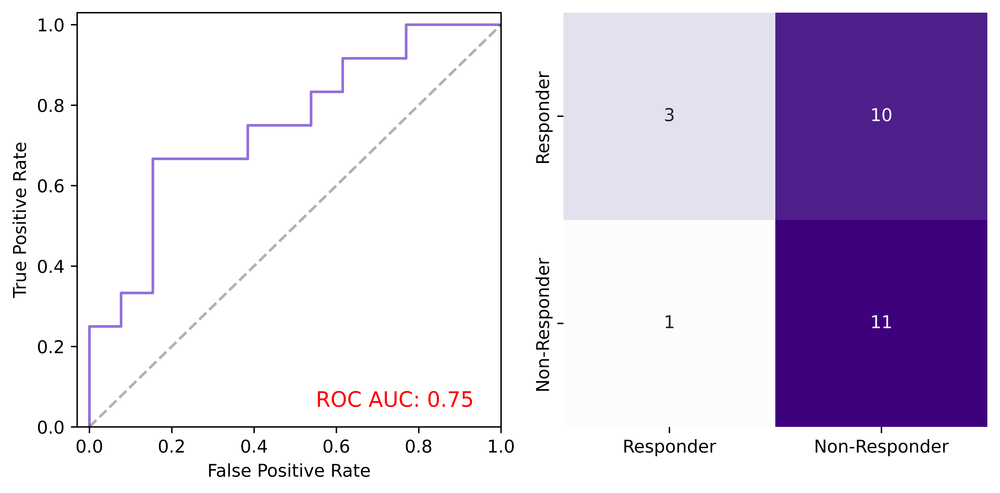

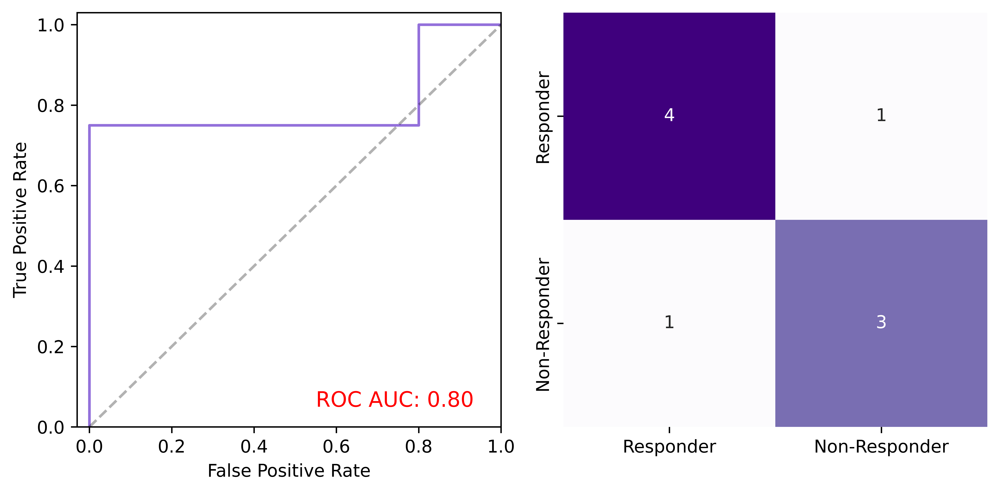

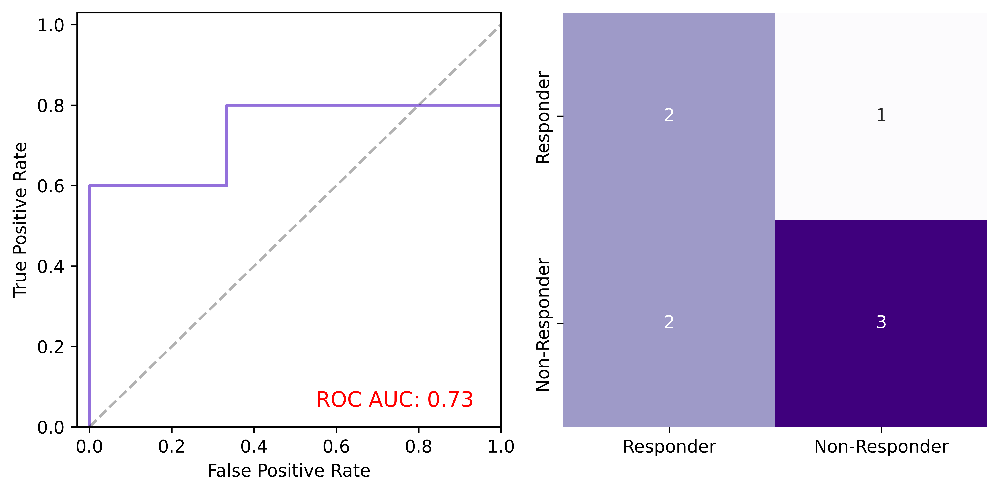

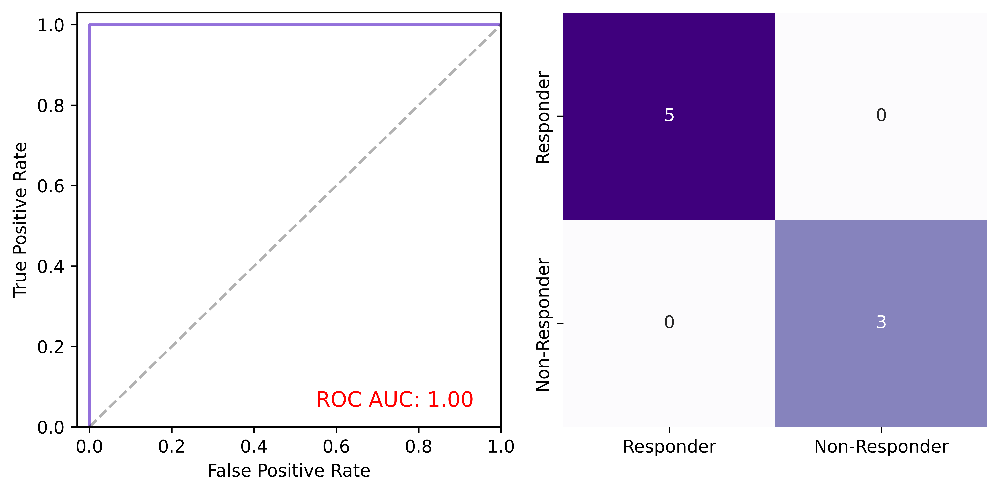

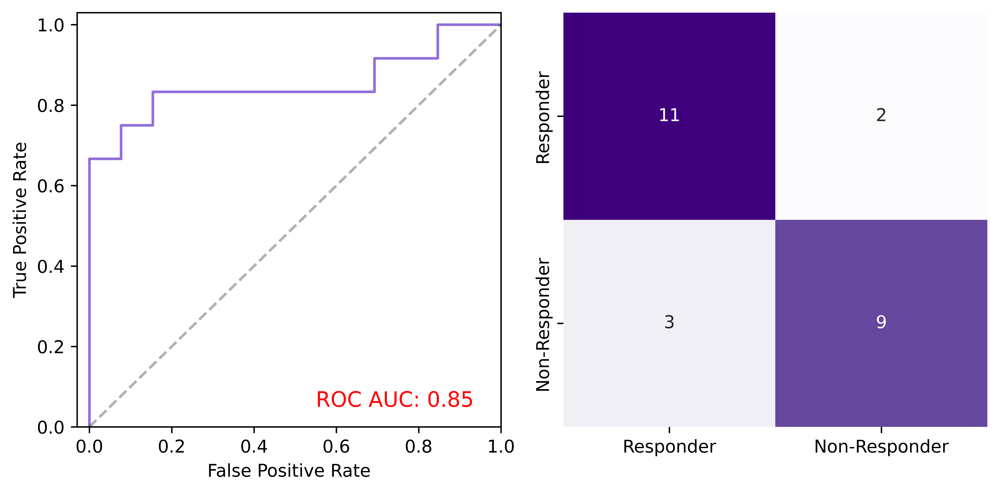

In [18]:
plot_metrics(metrics[28], title='DELFI_Hold_Screen')
plot_metrics(metrics[29], title='DELFI_Hold_Day0')
plot_metrics(metrics[30], title='DELFI_Hold_AdjWk1')
plot_metrics(metrics[31], title='DELFI_Hold_Overall')

plot_metrics(metrics[32], title='MDS_Hold_Screen')
plot_metrics(metrics[33], title='MDS_Hold_Day0')
plot_metrics(metrics[34], title='MDS_Hold_AdjWk1')
plot_metrics(metrics[35], title='MDS_Hold_Overall')

In [19]:
delfi_train_eval, mds_train_eval = eval_model(delfi_train, mds_train, delfi_svd, mds_svd, delfi_m, mds_m, "Training_Data")

df_train = pd.concat([delfi_train_eval, mds_train_eval, delfi_train['Treatment Response'], delfi_train['Patient Number'], delfi_train['Type of Visit']], axis=1)

In [20]:
train_predictions = df_train.groupby('Patient Number').apply(adjust_coefficients_mean)

In [21]:
all_predictions = pd.concat([train_predictions, institute_predictions, hold_predictions])

In [22]:
with open('treatment_response_dict.pkl', 'wb') as f:
    pickle.dump(all_predictions['Treatment Response'].to_dict(), f)

with open('predicted_treatment_response_dict.pkl', 'wb') as f:
    pickle.dump(all_predictions['Predicted Treatment Response'].to_dict(), f)